# **Regressão Linear**

# Alegrete

Este notebook fornece algumas visualizações para o trabalho de regressão linear. Para conseguir usar, implemente as funções no seu `alegrete.py` e tenha as bibliotecas `numpy` e `matplotlib` instaladas.

O notebook usa um conjunto de dados sintetico. Adapte-o para carregar e usar os dados do `alegrete.csv`.

In [1]:
!ls '/content/'

alegrete.csv  alegrete.py  sample_data


### Imports das bibliotecas de plot e da solucao implementada

In [2]:
%matplotlib inline
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import alegrete

### Visualizacao dos dados

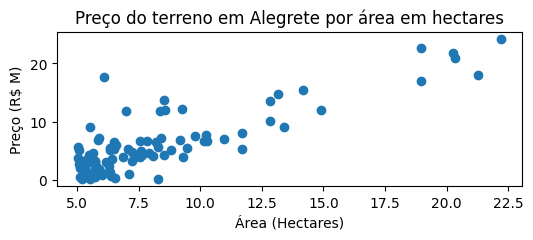

In [3]:
# dataset ficticio -- troque para carregar o alegrete.csv
from numpy import genfromtxt

dataset = genfromtxt('/content/alegrete.csv', delimiter=',')

#Gráfico dos dados
plt.figure(figsize=(6, 2))
plt.scatter(dataset[:,0], dataset[:,1])
plt.xlabel('Área (Hectares)')
plt.ylabel('Preço (R$ M)')
plt.title('Preço do terreno em Alegrete por área em hectares')
plt.show()

### Execucao da regressao linear e calculo do EQM por epoca/iteracao

0.8031840710076281 0.7242853382434477
[0.790344154227526, 0.7735115668538629, 0.759520642377338, 0.743664309512232, 0.7291839564372714, 0.7138469422898391, 0.6991905403419157, 0.6841557201785218, 0.6694715027845912, 0.6546354959097029, 0.6399933713166682, 0.625306748108267, 0.6107394781760309, 0.5961784005671326, 0.5817011316397095, 0.5672539023231555, 0.552873428600994, 0.5385341113657747, 0.5242532684559309, 0.5100186623252629, 0.49583841105991716, 0.48170661512052565, 0.4676270298816993, 0.4535967625699653, 0.43961750002725947, 0.42568777625055015, 0.4118082976615717, 0.39797827563911203, 0.3841979522660783, 0.3704668608670744, 0.35678502395615663, 0.3431521282174927, 0.32956809268468684, 0.31603267743713587, 0.3025457530834091, 0.2891071151667552, 0.2757166119785276, 0.2623740565305004, 0.2490792871749655, 0.23583212585249663, 0.22263240684260188, 0.20947995695970495, 0.19637460918829097, 0.1833161932888235, 0.17030454226369068, 0.1573394879005096, 0.144420863837766, 0.131548503449

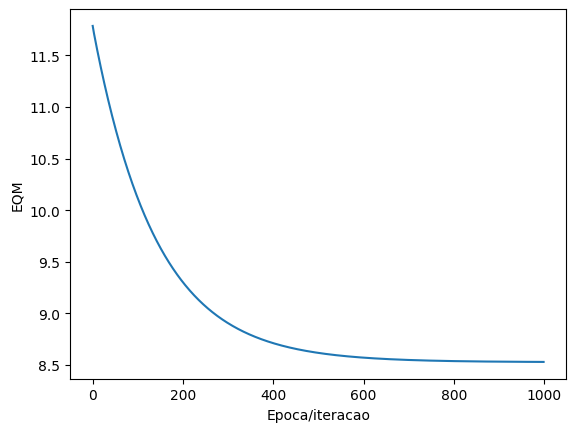

In [4]:
from numpy.random import normal
import random

theta_0 = random.uniform(0,1)
theta_1 = random.uniform(0,1)
print(theta_0, theta_1)

b_history, w_history = alegrete.fit(
    dataset, theta_0, theta_1,
    alpha=0.01, num_iterations=1000
)

# valores finais de theta0 e theta1
final_b, final_w = b_history[-1], w_history[-1]

mse_list = [alegrete.compute_mse(b, w, dataset) for b, w in zip(b_history, w_history)]
print(f"EQM final: {mse_list[-1]}")


plt.plot(mse_list)
plt.xlabel('Epoca/iteracao')
plt.ylabel('EQM')
plt.show()

### Plot da curva final

Curva encontrada: 1.148950096154838*x + -3.332330515362194


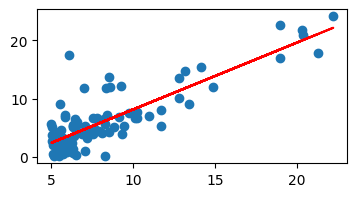

In [5]:
#Imprimir parâmetros otimizados
print (f'Curva encontrada: {final_w}*x + {final_b}')

#plota os dados
plt.figure(figsize=(4, 2))
plt.scatter(dataset[:,0], dataset[:,1])

# plota a curva de ajuste
pred = final_w*dataset[:,0] + final_b
plt.plot(dataset[:,0], pred, c='r')
plt.show()

### Progresso da descida do gradiente com o número de iterações

Execute a celula e use os controles abaixo do grafico para visualizar o progresso do seu ajuste

Pode aparecer um grafico "extra" abaixo da animacao, apenas ignore.

<ipython-input-6-855669909b9e>:18: UserWarning: You passed in an explicit save_count=50 which is being ignored in favor of frames=1000.
  ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=20, save_count=50)


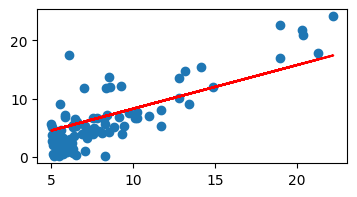

In [6]:
fig = plt.figure(figsize=(4, 2))
ax = fig.add_subplot(111)

# conjunto de dados
ax.scatter(dataset[:,0], dataset[:,1])

# linha com os valores iniciais dos parametros
pred = w_history[0]*dataset[:,0] + b_history[0]
line, = ax.plot(dataset[:,0], pred, '-',c='r')

# funcao que atualiza a linha a cada passo
def animate(i):
    pred = w_history[i] * dataset[:,0] + b_history[i]
    line.set_ydata(pred)
    return line,

# mude interval para trocar a velocidade da animacao
ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=20, save_count=50)
HTML(ani.to_jshtml())

---

Leonardo Azzi Martins

Instituto de Informática

Universidade Federal do Rio Grande do Sul